In [4]:
# Библиотеки
%pip install pandas numpy
import pandas as pd
import numpy as np
import json
import os
%pip install scipy seaborn
import matplotlib.pyplot as plt
import seaborn as sns


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\Valentin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\Valentin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Файл Orders
# OrderID - ID Заказа,
# UserID - ID клиента,
# OrderTime - время заказа,
# items - список элементов в заказе, каждый элемент описан словарем:
#  ItemID  - ID продукта, 
#  price - цена единицы товара, 
# quantity - количество единиц товара в заказе

# Файл Categories

# ItemID - ID продукта,
# Category - категория продукта,
# ParentCategory - более крупная категория продукта

# Задание
# 1.Визуализируйте динамику продаж напитков в ParentCategory. Есть ли эффект сезонности в продажах?
# 2.Исследуйте и покажите на графике, как отличаются продажи в будние и выходные в категориях 'Сокосодержащие напитки, смузи' и "Печенье" ?
# 3.Визуализируйте структуру продаж ParentCategory по показателю GMV за один месяц. Укажите категорию с наибольшей долей GMV.
# 4.Исследуйте взаимосвясь между продажами категорий 'Чипсы, снеки, попкорн' и 
# напитками:'Вода', 'Газированные напитки', 'Соки, нектары', 'Лимонады', 'Безалкогольное пиво', 'Вино', 'Пиво'. С чем сильнее коррелируют 'Чипсы, снеки, попкорн'?

In [2]:
# Чтение файлов
categories=pd.read_csv('..\Home_worK\categories.csv')
orders=pd.read_json(os.path.join('..','Home_worK','orders.json'))

In [48]:
# Создаем DataFrame из списка purch
doom=orders.explode('items',ignore_index = True)
purch=list([])
for i in range(len(doom)):
    q=list([])
    g=list(doom['items'][i].values())
    p=doom['Date'][i]
    g.append(p)
    purch.append(g)
purch_table=pd.DataFrame(purch,columns=['ItemID', 'price','quantity','date']);
purch_table['income']=purch_table['price']*purch_table['quantity'];
purch_table['ItemID']=purch_table['ItemID'].astype(int)
total_tab=pd.merge(purch_table,categories, on='ItemID');
total_tab.head(1)

,ItemID,price,quantity,date,income,Category,ParentCategory
0,413736,36.72,2,2021-01-01,73.44,Мороженое,Молочная продукция


In [14]:
# Создаем таблицу с количеством продаж/покупок по дате
a=total_tab.query('ParentCategory=="Напитки"')
a.groupby('date')['quantity'].sum()
sales=a.groupby(['date'])['quantity'].sum().reset_index();
sales.sort_values(by='quantity', ascending=False)
# Создаем таблицу с доходом по дате
drinks=total_tab.query('ParentCategory=="Напитки"')
drinks
drinks.groupby(['date','ParentCategory'])['income'].sum()
drink=drinks.groupby(['date','ParentCategory'])['income'].sum().reset_index();
drink
# Объединяем таблци sales and drink по дате
table_1=pd.merge(sales,drink, on='date', how='left')
table_1
table_1['Month'] = pd.DatetimeIndex(table_1['date']).month
Quarter_Mapping = {1:1, 2:1, 3:1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4}
table_1['Quarter'] = table_1['Month'].map(Quarter_Mapping)
table_1.rename(columns={'quantity': 'Sales'},inplace=True)

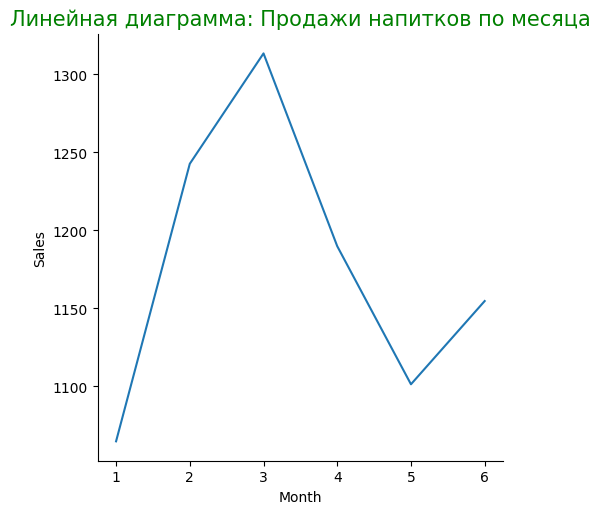

In [15]:
# 1.Визуализируйте динамику продаж напитков в ParentCategory. Есть ли эффект сезонности в продажах?
# Стром диаграмму по таблицу Table_1- продажи напитков по месяцам
sns.relplot(
    x='Month',
    y='Sales', 
    dashes=False, 
    markers=True,
    data=table_1, 
    kind='line', 
    errorbar=None)
plt.title('Линейная диаграмма: Продажи напитков по месяца', size=15, color='g');

# Так как месячных данных очень мало, сложно сделать вывод о сезонности продаж напитков. Из граффика видно, что в 1 квартале продажи росли, в то время, как во втором квартале они снизились,
# но с мая по июнь продажи начали возрастать. Можно предположить, что в летний период с июня по август продажи напитков будут расти. 

In [49]:
# 2.Исследуйте и покажите на графике, как отличаются продажи в будние и выходные в категориях 'Сокосодержащие напитки, смузи' и "Печенье" ?
# По столбцу Category фильтруем/отбыраем значения с названием 'Сокосодержащие напитки, смузи' и "Печенье"
from datetime import datetime as dt
total_tab.head(5)
prod=total_tab.loc[((total_tab['Category']=='Сокосодержащие напитки, смузи')|(total_tab['Category']=='Печенье'))].reset_index()
#prod.Category.value_counts().head()
# Создаем столбец с днями недели
prod['daywk']=prod['date'].dt.day_name()
# Создаем дамми столбец-является ли день недели выходным или нет
prod['weekend']=''
prod=prod.reset_index(drop = True)
for i in range(len(prod)):
    if prod['daywk'][i]=='Sunday':
        prod['weekend'][i]='Y'
    else:
        prod['weekend'][i]='N'
prod.head(1)

C:\Users\Valentin\AppData\Local\Temp\ipykernel_3140\80068045.py:16: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  prod['weekend'][i]='N'
C:\Users\Valentin\AppData\Local\Temp\ipykernel_3140\80068045.py:16: SettingWithCopyWarning: 
A value is 

,index,ItemID,price,quantity,date,income,Category,ParentCategory,daywk,weekend
0,41,875721,63.38,1,2021-01-01,63.38,Печенье,Мучные изделия,Friday,N


In [17]:
# Делаем группировку по дате и категориям
prod.head(2)
prof=prod.groupby(['date','Category'])['quantity'].sum().reset_index()
prof['daywk']=prof['date'].dt.day_name()
prof['weekend']=''
prof=prof.reset_index(drop = True)
for i in range(len(prof)):
    if prof['daywk'][i]=='Sunday':
        prof['weekend'][i]='Y'
    else:
        prof['weekend'][i]='N'
# Создаем столбец с месяцами
prof['Month'] = pd.DatetimeIndex(prof['date']).month
Quarter_Mapping = {1:1, 2:1, 3:1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4}
# Создаем столбец с кварталами
prof['Quarter'] = prof['Month'].map(Quarter_Mapping)
prof.rename(columns={'quantity': 'sales'},inplace=True)
prof

C:\Users\Valentin\AppData\Local\Temp\ipykernel_3140\1611065556.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  prof['weekend'][i]='N'
C:\Users\Valentin\AppData\Local\Temp\ipykernel_3140\1611065556.py:10: SettingWithCopyWarning: 
A value

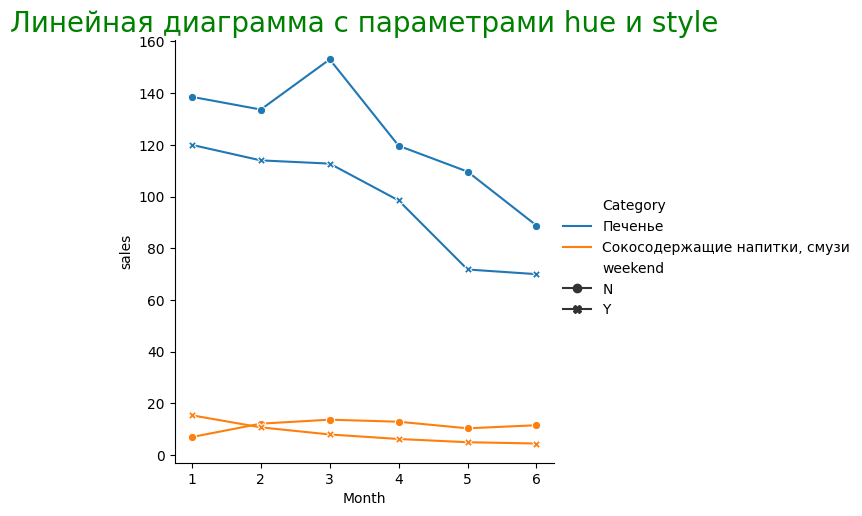

In [20]:
sns.relplot(
    x='Month',
    y='sales', 
    hue='Category',
    style='weekend', 
    dashes=False, 
    markers=True,
    data=prof, 
    kind='line', 
    errorbar=None)
plt.title('Линейная диаграмма с параметрами hue и style', size=20, color='g');

In [51]:
# 3.Визуализируйте структуру продаж ParentCategory по показателю GMV за один месяц. Укажите категорию с наибольшей долей GMV.
# Делаем группировку по дате и по ParentCategory
rol=total_tab.groupby(['date','ParentCategory'])['income'].sum().reset_index()
# Сортируем таблицу по доходу в порядке убывания
rol.sort_values(by='income', ascending=False)
# Добавляем столбец с месяцами
rol['Month'] = pd.DatetimeIndex(rol['date']).month
rol
# Группировка по месяцам
ref=rol.groupby(['Month','ParentCategory'])['income'].sum().reset_index()
#Осталяем только 1 месяц (январь)
result=ref.query('Month==1')
result.head(2)


,Month,ParentCategory,income
0,1,Бакалея,4543752.43
1,1,Бытовая химия,1329185.07


In [57]:
# Специально было выыыделено 8 категорий по наибольшему доходу (чтобы на диагремме лучше отображалось, так как если выводить все категория на диграмме будет плохо видно) и проведена сортировка по доходу
result=ref.query('Month==1').sort_values('income', ascending=False).reset_index().nlargest(8, 'income')
result['ParentCategory']=result['ParentCategory'].astype('string')
result.head(1)

,index,Month,ParentCategory,income
0,11,1,"Мясо, птица, рыба",5802670.85


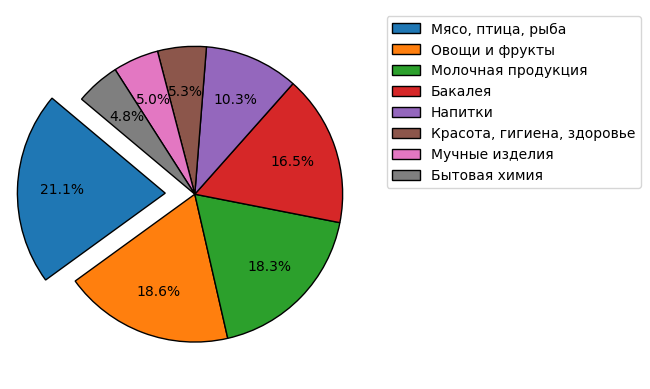

In [33]:
# Сделали круговую диаграмму и выделили один кусок с самаой большой долей дохода- это Мясо, птица, рыба
labels = result['ParentCategory']
explode=[]
for i in range(len(result)):
    if i==0:
        explode.append(0.2)
    else:
        explode.append(0)
wedge_properties = {"edgecolor":"k",'linewidth': 1}

fig, ax = plt.subplots()
ax.pie(v, explode=explode, wedgeprops=wedge_properties,startangle=140, autopct="%1.1f%%", pctdistance=0.7)
ax.legend(labels, loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

In [58]:
# 4. Исследуйте взаимосвясь между продажами категорий 'Чипсы, снеки, попкорн' и напитками:'Вода', 
# 'Газированные напитки', 'Соки, нектары', 'Лимонады', 'Безалкогольное пиво', 'Вино', 'Пиво'. С чем сильнее коррелируют 'Чипсы, снеки, попкорн'?
# Сортируем таблицу по необходимым категориям
total_tab.head(5)
qule=total_tab.groupby(['date','Category'])['quantity'].sum().reset_index()
qule=qule.loc[((qule['Category']=='Чипсы, снеки, попкорн')|(qule['Category']=='Вода')|(qule['Category']=='Газированные напитки')|(qule['Category']=='Соки, нектары')|
               (qule['Category']=='Лимонады')|(qule['Category']=='Безалкогольное пиво')|(qule['Category']=='Вино')|(qule['Category']=='Пиво'))]
qule['Month'] = pd.DatetimeIndex(qule['date']).month
qule.head(1)


,date,Category,quantity,Month
7,2021-01-01,Безалкогольное пиво,7,1


In [59]:
# Преобразуем таблицу таким образом, чтобы каждая категория была отдельным столбцом (По пиву была только одна запись)
ret = pd.DataFrame(qule.groupby(["Category", "date"]).quantity.mean())
ret= ret.reset_index()
ret = ret.pivot(index='date', columns='Category', values='quantity')
ret.head(1)

Category,Безалкогольное пиво,Вино,Вода,Газированные напитки,Лимонады,Пиво,"Соки, нектары","Чипсы, снеки, попкорн"
date,,,,,,,,
2021-01-01,7.0,NaN,154.0,12.0,5.0,NaN,40.0,NaN


In [55]:
# Формируем корреляционную матрицу
corr = ret.corr()


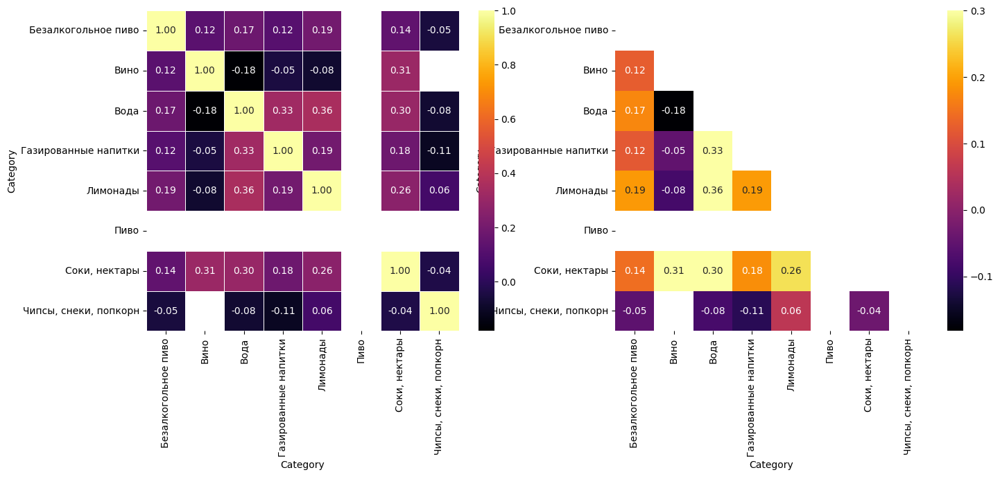

In [56]:
# Визуализируем корреляционную матрицу.
fig, (ax1, ax2)= plt.subplots(1,2, figsize=(16,6)) 
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, mask=mask, vmax=.3, annot=True, fmt='.2f', cmap="inferno", ax=ax2)
sns.heatmap(corr, annot=True, fmt='.2f',linewidths=.5, cmap="inferno", ax=ax1);

plt.show()
# В результате получаем, что ('Чипсы, снеки, попкорн' имеют)  "сильную" положительную корреляцию с Лимоналами (чем большем покупаем 'Чипсы, снеки, попкорн' имеют, тем больше покупаем Лимонадов)
# и самая сильная отрицательная корреляуия с 'Газированные напитки' (чем большем покупаем 'Чипсы, снеки, попкорн' имеют, тем меньше берут 'Газированные напитки').